# Satellite images segmentation

The task consists of creating a neural model able to perform semantic segmentation on satellite images into six (seven with the no information) different classes. The data used in this project is extracted from the [IGN](https://geoservices.ign.fr/telechargement) archives, and can be downloaded [here](https://drive.google.com/file/d/1y73mUPzS5Hhq1RjPXc9bxch-Nv6HlJem/view?usp=sharing).

Each tile in the dataset has a 1000x1000 resolution representing a 500m x 500m footprint (the resolution is 50cm per pixel).

The file structure of the dataset is as follows:
```none
├── ign
│   ├── annotations
│   │   ├── training
│   │   │   ├── aaa.png
│   │   │   ├── bbb.png
│   │   ├── validation
│   │   │   ├── xxx.png
│   │   │   ├── yyy.png
│   ├── images
│   │   ├── training
│   │   │   ├── aaa.png
│   │   │   ├── bbb.png
│   │   ├── validation
│   │   │   ├── xxx.png
│   │   │   ├── yyy.png

```

Here is an example of the image/mask contained in the dataset: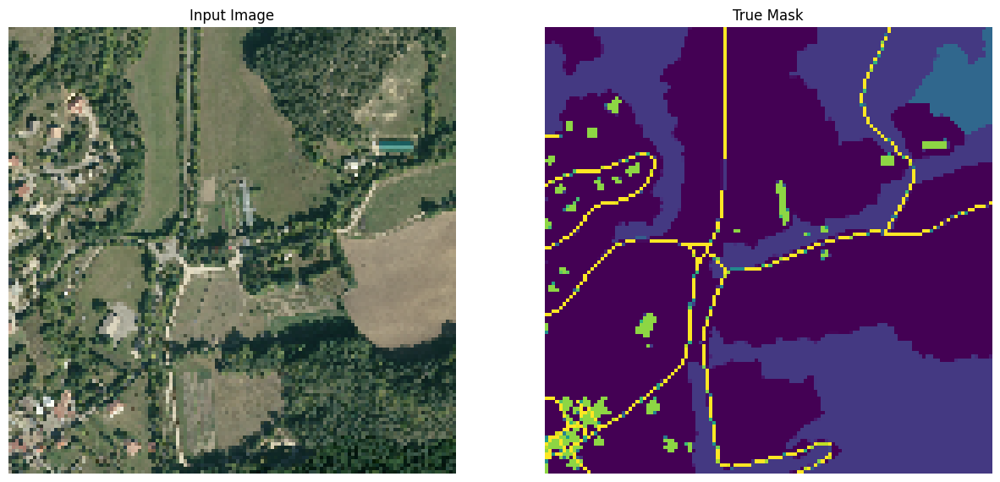

HINT: If the data does not fit into the memory, try by patching the image into smaller portions.

## Downloading the data

The data can be either downloaded from the link above and uploaded directly on Colab, or by running the following code snippet, that automatically downloads the data and unzip it.

## Multi-class segmentation

In this project, the input-target pair is composed by a $1000 \times 1000$ RGB image as visualized above, together with a $1000 \times 1000$ mask, that classifies each pixel by assigning to it a real number.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import os
import glob

X_path = '/kaggle/input/ign-satellite-images-segmentation/ign/images'
Y_path = '/kaggle/input/ign-satellite-images-segmentation/ign/annotations'

# sorting datasets
train_name = sorted(os.listdir(os.path.join(X_path, 'training')))
test_name = sorted(os.listdir(os.path.join(X_path, 'validation')))

# As an example: load a sample to check the data
x_sample = plt.imread(os.path.join(X_path, 'training', train_name[10]))
y_sample = plt.imread(os.path.join(Y_path, 'training', train_name[10]))

print(f"Shape of x: {x_sample.shape}. Shape of y: {y_sample.shape}.")
# print(f"Unique values of x: {np.unique(x_sample)}.") # pixels intensities in range [0, 1]
print(f"Unique values of y: {np.unique(y_sample)}.") # unique classes present

Shape of x: (1000, 1000, 3). Shape of y: (1000, 1000).
Unique values of y: [0.         0.00392157 0.02352941].


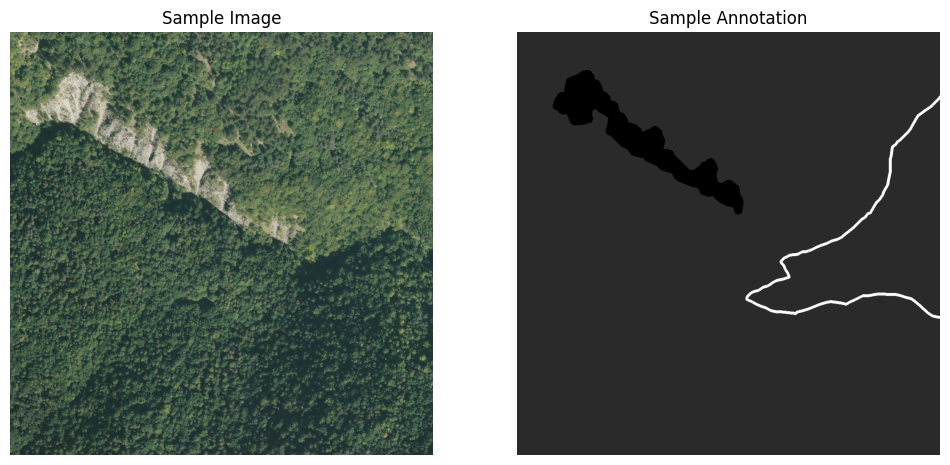

In [2]:
# display the sample image and its annotation
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Sample Image")
plt.imshow(x_sample)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Sample Annotation")
plt.imshow(y_sample, cmap='gray')  # Assuming annotation is grayscale
plt.axis('off')

plt.show()

In the example above, $\texttt{y_sample}$ contains 3 classes, represented by the three unique real numbers $[0, 0.00392157, 0.02352941]$.

Note that this approach is unusual in multiclass segmentation, where usually the mask is reshaped to be an $height \times width \times num. class$ binary array, where the pixel in position $(i, j)$ is classified as the class associated to the value 1, among the channels.

In this project, we assume that your data is processed as described above, since the metric used for the evaluation is implemented this way.  

## Metrics
The comparison metric for this project is the Dice Cofficient for multi-class segmentation (see the Lab about Segmentation for more informations). To apply this function, you are required to reshape both the predicted mask and the true mask to shape $\texttt{(batch_size, h, w, num_classes)}$, where $\texttt{num_classes}$ is the number of segmentation classes.

**IMPORTANT**: Remember to leave a print of average Dice Coefficient among the test set on the Notebook for a comparison. To do that, just measure the Dice Coffient by using the functions below for each batch, and take the average.

In [3]:
import numpy as np
import matplotlib.pyplot as plt

def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    smooth = 0.0001
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def dice_coef_multilabel(y_true, y_pred, numLabels):
    dice=0
    for index in range(numLabels):
        dice += dice_coef(y_true[:,:,:,index], y_pred[:,:,:,index])
    return dice/numLabels

## Project implementation

Good luck!

# the notebook was developed using kaggle platform and its free GPU P100

In [4]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

2024-07-10 17:38:40.110838: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-10 17:38:40.110973: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-10 17:38:40.245853: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Num GPUs Available:  1


## imports

In [5]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers, models, optimizers, regularizers
import random

# step 1: data exploration

 ## number of classes 
- We want to know the number of classes in order to reshape the annotations in the canonical form and perform a segmentation task 

## classes distribution 
- we want to know the distribution of calsses, in particular we are interested in discover if classes equally distributed

Classes distribution in training: {0.0: 0.11432979833333333, 0.003921569: 0.61495632, 0.023529414: 0.014956986666666667, 0.007843138: 0.11629334333333333, 0.019607844: 0.0015306266666666667, 0.015686275: 0.06890768333333333, 0.011764707: 0.06902524166666667}
Classes distribution in validation: {0.003921569: 0.61821202, 0.023529414: 0.015532895, 0.011764707: 0.072775875, 0.015686275: 0.051322455, 0.0: 0.12165315, 0.019607844: 0.00193873, 0.007843138: 0.118564875}
The classes are the same for training and validation
The distributions are different for training and validation


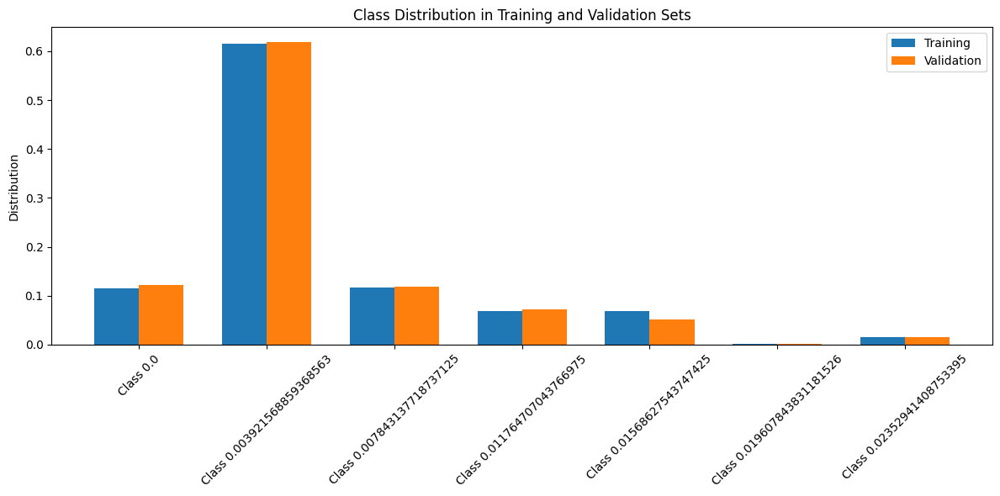

In [6]:
def find_unique_classes(data_dir, split='training'):
    masks_dir = os.path.join(data_dir, 'annotations', split)
    mask_paths = tf.data.Dataset.list_files(os.path.join(masks_dir, '*.png'), shuffle=False)
    
    def decode_mask(mask_path):
        mask = tf.io.read_file(mask_path)
        mask = tf.io.decode_png(mask, channels=1)
        return tf.image.convert_image_dtype(mask, tf.float32)
    
    unique_classes = set() # store distinct classes
    class_counts = {} # store the presence of each class
    total_pixels = 0 # store the total number of pixels 
    
    for mask_path in mask_paths:
        mask = decode_mask(mask_path)
        flattened_mask = tf.reshape(mask, [-1])
        
        # Debug information
        # print(f"Mask shape: {mask.shape}")
        # print(f"Unique values in mask: {tf.unique(flattened_mask)[0]}")
        
        try:
            unique_result = tf.unique_with_counts(flattened_mask)
            unique_values, counts = unique_result[0], unique_result[2]
        except ValueError as e:
            print(f"Error processing mask: {mask_path}")
            print(f"Error message: {str(e)}")
            print(f"Unique result shape: {unique_result.shape}")
            continue
        
        for value, count in zip(unique_values.numpy(), counts.numpy()):
            if value not in class_counts:
                class_counts[value] = 0
            class_counts[value] += count
            total_pixels += count
        unique_classes.update(unique_values.numpy())
    
    if total_pixels == 0:
        print("Warning: No valid pixels found in the masks.")
        return set(), {}
    
    # compute distribution for each class 
    distributions = {cls: count / total_pixels for cls, count in class_counts.items()}
    return unique_classes, distributions

def plot_class_distributions(training_dist, validation_dist):
    classes = sorted(set(list(training_dist.keys()) + list(validation_dist.keys())))
    
    training_values = [training_dist.get(cls, 0) for cls in classes]
    validation_values = [validation_dist.get(cls, 0) for cls in classes]
    
    x = np.arange(len(classes))
    width = 0.35
    
    fig, ax = plt.subplots(figsize=(12, 6))
    rects1 = ax.bar(x - width/2, training_values, width, label='Training')
    rects2 = ax.bar(x + width/2, validation_values, width, label='Validation')
    
    ax.set_ylabel('Distribution')
    ax.set_title('Class Distribution in Training and Validation Sets')
    ax.set_xticks(x)
    ax.set_xticklabels([f'Class {cls}' for cls in classes])
    ax.legend()
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# main directory 
data_dir = '/kaggle/input/ign-satellite-images-segmentation/ign'

try:
    # training classes distribution 
    unique_classes_training, distributions_training = find_unique_classes(data_dir, split='training')
    print("Classes distribution in training:", {key: value for key, value in distributions_training.items()})
    # validation classes distribution 
    unique_classes_validation, distributions_validation = find_unique_classes(data_dir, split='validation')
    print("Classes distribution in validation:", {key: value for key, value in distributions_validation.items()})

    if unique_classes_training == unique_classes_validation:
        print("The classes are the same for training and validation")
        unique_classes = unique_classes_training
    else:
        print("The classes are different for training and validation")
        unique_classes = unique_classes_training.union(unique_classes_validation)

    if distributions_training == distributions_validation:
        print("The distributions are the same for training and validation")
    else:
        print("The distributions are different for training and validation")

    # Plot the class distributions in training and validation separatedly
    plot_class_distributions(distributions_training, distributions_validation)

except Exception as e:
    print(f"An error occurred: {str(e)}")

from the cell above we can see that:

1. number of classes is 7, and are shared among training and validation sets 
2. classes distribution is unbalanced
3. the distribution of classes is mostly the same for training and validation sets

We can proceed in two distinct way:

1. compute class weights in order to effectively train the model maximizing accuracy
2. we can use the dice coefficient metric, that is able to manage class inbalances as well, without considering class weights

We will follow the second way, as suggested in the problem description.


Inverse frequency class weights:
Class 0.0: 0.0114
Class 0.003921568859368563: 0.0021
Class 0.02352941408753395: 0.0870
Class 0.007843137718737125: 0.0112
Class 0.019607843831181526: 0.8505
Class 0.01568627543747425: 0.0189
Class 0.011764707043766975: 0.0189

Balanced class weights:
Class 0.0: 1.2495
Class 0.003921568859368563: 0.2323
Class 0.02352941408753395: 9.5512
Class 0.007843137718737125: 1.2284
Class 0.019607843831181526: 93.3325
Class 0.01568627543747425: 2.0732
Class 0.011764707043766975: 2.0696


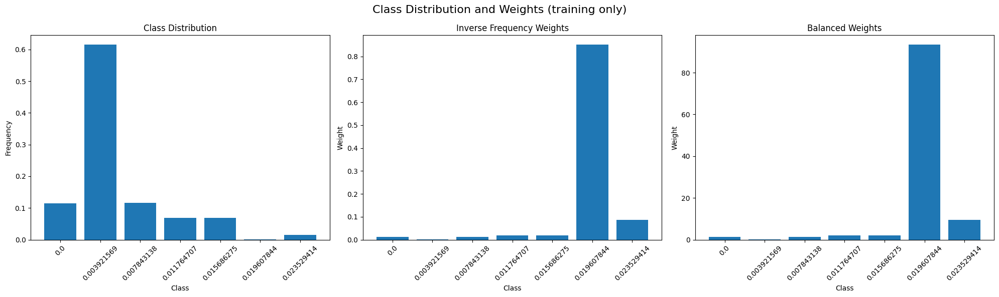

In [7]:
def compute_class_weights(distributions):
    # Method 1: Inverse of frequency
    weights_inv = {cls: 1.0 / freq for cls, freq in distributions.items()}
    
    # Normalize weights
    total_inv = sum(weights_inv.values())
    weights_inv_norm = {cls: weight / total_inv for cls, weight in weights_inv.items()}
    
    # Method 2: Balanced
    n_classes = len(distributions)
    weights_balanced = {cls: 1.0 / (n_classes * freq) for cls, freq in distributions.items()}
    
    return weights_inv_norm, weights_balanced

def plot_class_distributions_and_weights(distributions, weights_inv, weights_balanced):
    classes = sorted(distributions.keys())
    n_classes = len(classes)
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))
    fig.suptitle('Class Distribution and Weights (training only)', fontsize=16)
    
    bar_width = 0.8
    index = np.arange(n_classes)
    
    # Plot distributions
    axs[0].bar(index, [distributions[cls] for cls in classes], bar_width)
    axs[0].set_title('Class Distribution')
    axs[0].set_xlabel('Class')
    axs[0].set_ylabel('Frequency')
    axs[0].set_xticks(index)
    axs[0].set_xticklabels(classes, rotation=45)
    
    # Plot inverse weights
    axs[1].bar(index, [weights_inv[cls] for cls in classes], bar_width)
    axs[1].set_title('Inverse Frequency Weights')
    axs[1].set_xlabel('Class')
    axs[1].set_ylabel('Weight')
    axs[1].set_xticks(index)
    axs[1].set_xticklabels(classes, rotation=45)
    
    # Plot balanced weights
    axs[2].bar(index, [weights_balanced[cls] for cls in classes], bar_width)
    axs[2].set_title('Balanced Weights')
    axs[2].set_xlabel('Class')
    axs[2].set_ylabel('Weight')
    axs[2].set_xticks(index)
    axs[2].set_xticklabels(classes, rotation=45)
    
    # Adjust layout and display
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# compute class weights on training set 
weights_inv, weights_balanced = compute_class_weights(distributions_training)

print("\nInverse frequency class weights:")
for cls, weight in weights_inv.items():
    print(f"Class {cls}: {weight:.4f}")
    
print("\nBalanced class weights:")
for cls, weight in weights_balanced.items():
    print(f"Class {cls}: {weight:.4f}")

# Plot distributions and weights
plot_class_distributions_and_weights(distributions_training, weights_inv, weights_balanced)

In [8]:
# map each class to an index

class_to_index = {value: idx for idx, value in enumerate(sorted(unique_classes_training))}
index_to_class = {idx: value for idx, value in enumerate(sorted(unique_classes_training))}

print(f"Class to index mapping: {class_to_index}")
print(f"Index to class mapping: {index_to_class}")

Class to index mapping: {0.0: 0, 0.003921569: 1, 0.007843138: 2, 0.011764707: 3, 0.015686275: 4, 0.019607844: 5, 0.023529414: 6}
Index to class mapping: {0: 0.0, 1: 0.003921569, 2: 0.007843138, 3: 0.011764707, 4: 0.015686275, 5: 0.019607844, 6: 0.023529414}


In [9]:
# Choose which weights to use
# class_weights = weights_ivn
class_weights = weights_balanced

# Convert class weights to the format expected by Keras
class_weights_idx = {class_to_index[cls]:weight for cls, weight in class_weights.items()}

print("calss weights: ", class_weights)
print("class weigts idx: ", class_weights_idx)

calss weights:  {0.0: 1.2495180166472162, 0.003921569: 0.2323045364541385, 0.023529414: 9.55119811502648, 0.007843138: 1.22842063666249, 0.019607844: 93.33245393421181, 0.015686275: 2.0731671120923796, 0.011764707: 2.0696362578058274}
class weigts idx:  {0: 1.2495180166472162, 1: 0.2323045364541385, 6: 9.55119811502648, 2: 1.22842063666249, 5: 93.33245393421181, 4: 2.0731671120923796, 3: 2.0696362578058274}


# step 2: data preparation 

The provided ign datatset is divided in training (600 samples) and validation (200 samples) only, test set is not available. Images have a high resolution and annotations are not in the correct form. Then the main steps are the following: 

1. split the validation dataset in validation and test datasets
2. reduce the sizes of the images processed in order to save resources by creating patches 
3. reshape the annotation images in order to match the dice_coefficient function given using one-hot encoding
4. perform data augmentation in order to get a more robust model 

get training dataset
unique classes:  [0.0, 0.003921569, 0.007843138, 0.011764707, 0.015686275, 0.019607844, 0.023529414]
get validation dataset
unique classes:  [0.0, 0.003921569, 0.007843138, 0.011764707, 0.015686275, 0.019607844, 0.023529414]
splitting validation dataset --> get: new_val and test datasets
Training set size: 5400
New Validation set size: 900
Test set size: 900
prepare training dataset
prepare validation dataset
prepare test dataset


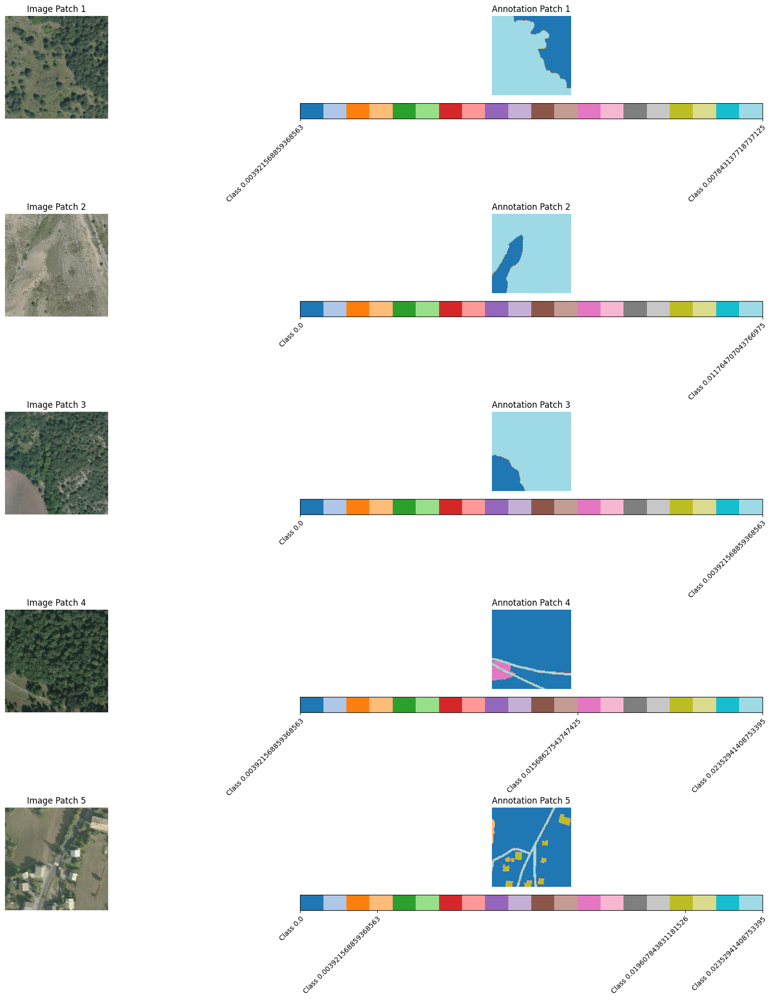

In [10]:
def decode_image(img):
    img = tf.io.decode_png(img, channels=3)
    return tf.image.convert_image_dtype(img, tf.float32)

def decode_mask(mask):
    mask = tf.io.decode_png(mask, channels=1)
    return tf.image.convert_image_dtype(mask, tf.float32)

def find_unique_classes(data_dir, split):
    masks_dir = os.path.join(data_dir, 'annotations', split)
    unique_classes = set()
    for mask_file in os.listdir(masks_dir):
        mask_path = os.path.join(masks_dir, mask_file)
        mask = tf.io.read_file(mask_path)
        mask = decode_mask(mask)
        unique_classes.update(np.unique(mask.numpy()))
    return sorted(list(unique_classes))

def map_classes(mask, class_to_index):
    mapped_mask = tf.zeros_like(mask, dtype=tf.int32)
    for class_value, idx in class_to_index.items():
        class_value = tf.cast(class_value, tf.float32)
        idx = tf.constant(idx, dtype=tf.int32)
        mapped_mask = tf.where(tf.equal(mask, class_value), idx, mapped_mask)
    return mapped_mask

def extract_patches(image, mask, patch_size=256, stride=256):
    """
    Extract all possible patches from an image and its mask.
    
    Args:
    image: A tensor of shape [height, width, channels]
    mask: A tensor of shape [height, width, 1] or [height, width]
    patch_size: The size of the square patches to extract
    stride: The stride between patches (use patch_size for non-overlapping patches)
    
    Returns:
    image_patches: A tensor of shape [num_patches, patch_size, patch_size, channels]
    mask_patches: A tensor of shape [num_patches, patch_size, patch_size, 1]
    """
    # Ensure mask has a channel dimension
    mask = tf.expand_dims(mask, axis=-1) if len(mask.shape) == 2 else mask
    
    # Get image dimensions
    image_shape = tf.shape(image)
    height, width = image_shape[0], image_shape[1]
    
    # Calculate the number of patches in each dimension
    num_patches_h = (height - patch_size) // stride + 1
    num_patches_w = (width - patch_size) // stride + 1
    
    # Extract patches from image and mask
    image_patches = tf.image.extract_patches(
        tf.expand_dims(image, 0),
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, stride, stride, 1],
        rates=[1, 1, 1, 1],
        padding='VALID'
    )
    mask_patches = tf.image.extract_patches(
        tf.expand_dims(mask, 0),
        sizes=[1, patch_size, patch_size, 1],
        strides=[1, stride, stride, 1],
        rates=[1, 1, 1, 1],
        padding='VALID'
    )
    
    # Reshape patches to [num_patches, patch_size, patch_size, channels]
    image_patches = tf.reshape(image_patches, [num_patches_h * num_patches_w, patch_size, patch_size, image.shape[-1]])
    mask_patches = tf.reshape(mask_patches, [num_patches_h * num_patches_w, patch_size, patch_size, mask.shape[-1]])
    
    return image_patches, mask_patches

def process_path(image_path, mask_path, patch_size=256, stride=256, class_to_index=None):
    # load images 
    img = tf.io.read_file(image_path)
    img = decode_image(img)
    mask = tf.io.read_file(mask_path)
    mask = decode_mask(mask)
    # map mask classes
    mask = map_classes(mask, class_to_index)
    # Extract patches
    img_patches, mask_patches = extract_patches(img, mask, patch_size, stride)
    return img_patches, mask_patches

def get_dataset(data_dir, split='training', patch_size=256, stride=256):
    images_dir = os.path.join(data_dir, 'images', split)
    masks_dir = os.path.join(data_dir, 'annotations', split)
    image_paths = tf.data.Dataset.list_files(os.path.join(images_dir, '*.png'), shuffle=False)
    mask_paths = tf.data.Dataset.list_files(os.path.join(masks_dir, '*.png'), shuffle=False)
    dataset = tf.data.Dataset.zip((image_paths, mask_paths))
    # compute the classes 
    unique_classes = find_unique_classes(data_dir, split)
    class_to_index = {float(value): idx for idx, value in enumerate(unique_classes)}
    print("unique classes: ", unique_classes)
    # process the datasets
    dataset = dataset.map(
        lambda x, y: process_path(x, y, patch_size, stride, class_to_index),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    # Flat map to create individual examples for each patch
    dataset = dataset.flat_map(
        lambda img_patches, mask_patches: tf.data.Dataset.from_tensor_slices((img_patches, mask_patches))
    )
    # reshape masks using one-hot encoding
    num_classes = len(class_to_index)
    dataset = dataset.map(
        lambda img, msk: (img, tf.one_hot(tf.squeeze(msk, axis=-1), depth=num_classes)),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    return dataset, class_to_index

def prepare_dataset(dataset, batch_size=32, cache=False, shuffle_buffer_size=1000):
    if cache:
        dataset = dataset.cache()
    dataset = dataset.shuffle(buffer_size=shuffle_buffer_size) # shuffle 
    dataset = dataset.batch(batch_size) # make batches 
    dataset = dataset.prefetch(tf.data.AUTOTUNE) # prepare data pipeline 
    return dataset

@tf.autograph.experimental.do_not_convert # silence the warning 
def split_validation_set(val_dataset, split_ratio=0.5):
    def split_generator():
        for i, data in enumerate(val_dataset):
            if i % 2 == 0:  # Even indices go to new_val
                yield (0, data)
            else:  # Odd indices go to test
                yield (1, data)
    
    output_signature = (
        tf.TensorSpec(shape=(), dtype=tf.int32),
        val_dataset.element_spec
    )

    split_dataset = tf.data.Dataset.from_generator(
        split_generator,
        output_signature=output_signature
    )
    # create test set
    new_val = split_dataset.filter(lambda x, data: x == 0).map(lambda x, data: data)
    # create new validation set 
    test = split_dataset.filter(lambda x, data: x == 1).map(lambda x, data: data)
    return new_val, test


def display_patches(dataset, num_patches=5, class_to_index=None):
    plt.figure(figsize=(20, 4*num_patches))
    
    for i, (image_batch, mask_batch) in enumerate(dataset.take(1)):  # Take only one batch
        for j in range(min(num_patches, image_batch.shape[0])):
            plt.subplot(num_patches, 2, 2*j + 1)
            plt.imshow(image_batch[j].numpy())
            plt.title(f"Image Patch {j+1}")
            plt.axis('off')
            
            plt.subplot(num_patches, 2, 2*j + 2)
            mask = tf.argmax(mask_batch[j], axis=-1)
            plt.imshow(mask.numpy(), cmap='tab20')
            plt.title(f"Annotation Patch {j+1}")
            plt.axis('off')
            
            if class_to_index:
                # Create a custom colorbar
                unique_values = tf.unique(tf.reshape(mask, [-1])).y.numpy()
                cbar = plt.colorbar(ticks=unique_values, orientation='horizontal', aspect=30, pad=0.08)
                index_to_class = {v: k for k, v in class_to_index.items()}
                cbar.set_ticklabels([f"Class {index_to_class[v]}" for v in unique_values])
                plt.setp(cbar.ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    
    plt.tight_layout()
    plt.show()

# main directory
data_dir = '/kaggle/input/ign-satellite-images-segmentation/ign'

# patch params 
patch_size = 256 # size of the patches
stride = patch_size # stride between patches (adjust for more or less overlap)

# Get the dataset and class_to_index mapping
print("get training dataset")
train_dataset, class_to_index = get_dataset(data_dir, 'training', patch_size, stride)
print("get validation dataset")
val_dataset, _ = get_dataset(data_dir, 'validation', patch_size, stride)

# split validation dataset in new_val and test 
print("splitting validation dataset --> get: new_val and test datasets")
new_val_dataset, test_dataset = split_validation_set(val_dataset)

# Function to count samples in a dataset
def count_samples(dataset):
    return sum(1 for _ in dataset)

# Print dataset sizes
print(f"Training set size: {count_samples(train_dataset)}")
print(f"New Validation set size: {count_samples(new_val_dataset)}")
print(f"Test set size: {count_samples(test_dataset)}")

# Prepare datasets
print("prepare training dataset")
train_dataset = prepare_dataset(train_dataset)
print("prepare validation dataset")
val_dataset = prepare_dataset(new_val_dataset)
print("prepare test dataset")
test_dataset = prepare_dataset(test_dataset)

# Display patches
display_patches(train_dataset, num_patches=5, class_to_index=class_to_index)

# step 3: build the model 

We are going to build a uNet that is repecting the limitation imposed of using a maximum of 10M parameters.

In [11]:
def conv_block(inputs, num_filters, kernel_size=3, activation='relu', padding='same'):
    x = layers.Conv2D(num_filters, kernel_size, padding=padding)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv2D(num_filters, kernel_size, padding=padding)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = layers.MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = layers.Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape, num_classes, base_filters=32, depth=4):
    inputs = layers.Input(input_shape)

    # Encoder
    skips = []
    x = inputs
    for i in range(depth):
        x, p = encoder_block(x, base_filters * (2**i))
        skips.append(x)
        x = p

    # Bridge
    x = conv_block(x, base_filters * (2**depth))

    # Decoder
    for i in reversed(range(depth)):
        x = decoder_block(x, skips[i], base_filters * (2**i))

    # Output
    outputs = layers.Conv2D(num_classes, 1, padding="same", activation="softmax")(x)

    model = models.Model(inputs, outputs, name="U-Net")
    return model

# Tensorflow version of Dice coefficient for use during training
def dice_coef_tf(y_true, y_pred, smooth=0.0001):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
# multilabel dice coeffcient 
def dice_coef_multilabel_tf(y_true, y_pred):
    numLabels = y_true.shape[-1]
    dice = 0
    for index in range(numLabels):
        dice += dice_coef_tf(y_true[:,:,:,index], y_pred[:,:,:,index])
    return dice / numLabels
# Loss function (1 - Dice Coefficient)
def dice_loss(y_true, y_pred):
    return 1 - dice_coef_multilabel_tf(y_true, y_pred)

# parameters 
input_shape = (patch_size, patch_size, 3)  # based on your patch size
num_classes = len(class_to_index)  # Use the number of classes from your dataset

# build the model 
model = build_unet(input_shape, num_classes)

# take the summary 
model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ activation_2[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_4[0][0]  

 Total params: 7,772,071 (29.65 MB)

 Trainable params: 7,766,183 (29.63 MB)

 Non-trainable params: 5,888 (23.00 KB)

# step 4: train the model 

In [12]:
# Custom callback for monitoring and visualization
class SegmentationMonitor(tf.keras.callbacks.Callback):
    def __init__(self, val_data, num_images=3, freq=5, save_path=None, dice_coef = dice_coef_multilabel_tf):
        super().__init__()
        self.val_data = val_data
        self.num_images = num_images
        self.freq = freq
        self.save_path = save_path
        self.index_to_class = index_to_class
        self.dice_coef = dice_coef

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.freq == 0:
            # Save model weights if save_path is provided
            if self.save_path:
                self.model.save_weights(self.save_path)

            # Get a batch of validation data
            test_images, test_masks = next(iter(self.val_data))

            # Make predictions
            pred_masks = self.model.predict(test_images)

            # Visualize results for multiple images
            fig, axes = plt.subplots(self.num_images, 3, figsize=(15, 5 * self.num_images))
            for i in range(self.num_images):
                # Randomly select an image from the batch
                random_index = random.randint(0, test_images.shape[0] - 1)
                random_image = test_images[random_index]
                random_pred_mask = pred_masks[random_index]
                random_true_mask = test_masks[random_index]
                # Original image
                axes[i, 0].imshow(random_image)
                axes[i, 0].set_title(f'Image: Epoch {epoch + 1}')
                axes[i, 0].axis('off')
                # True segmentation
                axes[i, 1].imshow(tf.argmax(random_true_mask, axis=-1), cmap='tab20')
                axes[i, 1].set_title(f'Ground Truth: Epoch {epoch + 1}')
                axes[i, 1].axis('off')
                # Predicted segmentation
                axes[i, 2].imshow(tf.argmax(random_pred_mask, axis=-1), cmap='tab20')
                axes[i, 2].set_title(f'Prediction: Epoch {epoch + 1}')
                axes[i, 2].axis('off')
            plt.tight_layout()
            plt.show()
            plt.close()
            
            # Calculate and print Dice coefficient
            dice_score = self.dice_coef(test_masks, pred_masks)
            print(f'Epoch {epoch + 1}, Dice Coefficient: {dice_score:.4f}')
            print('-------------------')

# custom callbacks ------------------------------------------------------------------------------

# Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="dice_coef_multilabel_tf",
    mode='max',
    restore_best_weights=True,
    start_from_epoch=0,
    patience=3
)

# Model Checkpoint
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath='/kaggle/working/best_model.keras',
    save_best_only=True,
    monitor='dice_coef_multilabel_tf',
    mode='max',
    verbose=1
)

# Reduce Learning Rate on Plateau
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='dice_coef_multilabel_tf',
    factor=0.2,
    patience=2,
    min_lr=1e-6,
    mode='max',
    verbose=1
)

# TensorBoard
tensorboard = tf.keras.callbacks.TensorBoard(
    # log_dir='./logs',
    histogram_freq=1,
    write_graph=True,
    write_images=True,
    update_freq='epoch',
    profile_batch=2
)

# Custom Segmentation Monitor (already present)
segmentation_monitor = SegmentationMonitor(
    val_data=val_dataset,
    num_images=3,
    freq=5,
    # save_path='/kaggle/working/weights.h5'  # Optional: path to save weights
)

# Learning Rate Schedule
# lr_schedule = optimizers.schedules.ExponentialDecay(
#     initial_learning_rate=1e-3,
#     decay_steps=10000,
#     decay_rate=0.9
# )

# set the optimizer 
optimizer = optimizers.Adam(learning_rate=1e-3)

# Gradient Clipping
optimizer = optimizers.Adam(learning_rate=1e-3, clipnorm=1.0)

# Focal Loss (for dealing with class imbalance)
def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
        return -tf.reduce_sum(alpha * tf.pow(1. - pt_1, gamma) * tf.math.log(pt_1)) \
               -tf.reduce_sum((1-alpha) * tf.pow( pt_0, gamma) * tf.math.log(1. - pt_0))
    return focal_loss_fixed

# Mixed Precision Training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Combine all callbacks
callbacks = [
    early_stopping,
    model_checkpoint,
    reduce_lr,
    tensorboard,
    segmentation_monitor
]

Epoch 1/30


2024-07-10 17:40:21.522493: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 2.99935, expected 2.28267
2024-07-10 17:40:21.522553: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.17207, expected 3.45539
2024-07-10 17:40:21.522562: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.3619, expected 3.64522
2024-07-10 17:40:21.522570: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.47131, expected 4.75463
2024-07-10 17:40:21.522578: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.50046, expected 4.78378
2024-07-10 17:40:21.522585: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.73262, expected 5.01594
2024-07-10 17:40:21.522593: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 4.78622, expected 4.06954
2024-07-10 17:40:21.522601: E external/local_xla/xla/ser

    168/Unknown 121s 303ms/step - dice_coef_multilabel_tf: 0.2490 - loss: 0.7510

2024-07-10 17:42:04.570022: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.35121, expected 2.40063
2024-07-10 17:42:04.570094: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.59262, expected 3.64204
2024-07-10 17:42:04.570112: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.90437, expected 3.95378
2024-07-10 17:42:04.570131: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.07336, expected 5.12277
2024-07-10 17:42:04.570146: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 6.68734, expected 5.73676
2024-07-10 17:42:04.570158: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 6.9172, expected 5.96662
2024-07-10 17:42:04.570170: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.64532, expected 5.69474
2024-07-10 17:42:04.570183: E external/local_xla/xla/ser

    169/Unknown 166s 568ms/step - dice_coef_multilabel_tf: 0.2494 - loss: 0.7506

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
2024-07-10 17:42:57.902007: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.35047, expected 2.80959
2024-07-10 17:42:57.902061: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 3.81961, expected 3.27872
2024-07-10 17:42:57.902075: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 4.35367, expected 3.81278
2024-07-10 17:42:57.902089: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 21: 3.87151, expected 3.33062
2024-07-10 17:42:57.902107: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 30: 4.11246, expected 3.57157
20


Epoch 1: dice_coef_multilabel_tf improved from -inf to 0.30953, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 185s 676ms/step - dice_coef_multilabel_tf: 0.2497 - loss: 0.7503 - val_dice_coef_multilabel_tf: 0.0339 - val_loss: 0.9659 - learning_rate: 0.0010
Epoch 2/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - dice_coef_multilabel_tf: 0.3656 - loss: 0.6344
Epoch 2: dice_coef_multilabel_tf improved from 0.30953 to 0.37959, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 64s 362ms/step - dice_coef_multilabel_tf: 0.3657 - loss: 0.6343 - val_dice_coef_multilabel_tf: 0.0571 - val_loss: 0.9419 - learning_rate: 0.0010
Epoch 3/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - dice_coef_multilabel_tf: 0.4003 - loss: 0.5997
Epoch 3: dice_coef_multilabel_tf improved from 0.37959 to 0.41668, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 65s 368ms/step - dice_coef_multilabel_tf: 0.4004 - loss: 0.5996 - val_

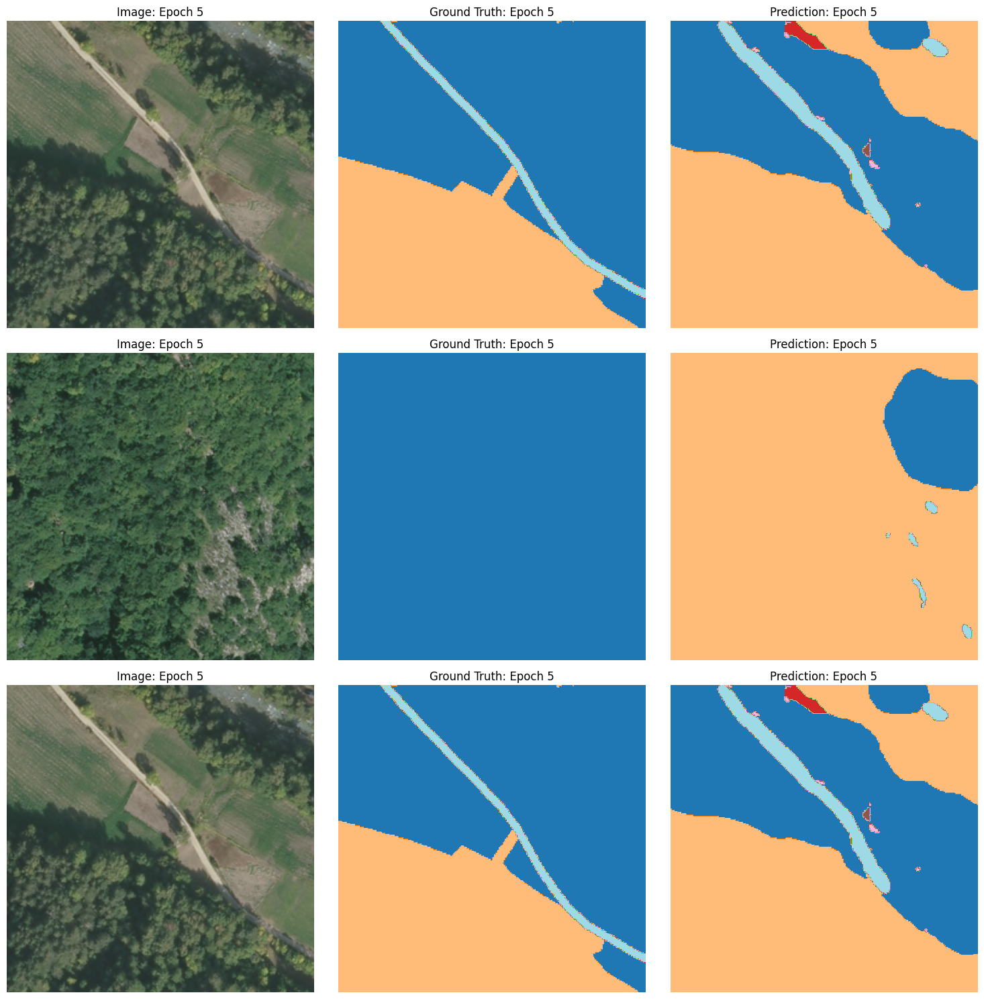

Epoch 5, Dice Coefficient: 0.3581
-------------------
169/169 ━━━━━━━━━━━━━━━━━━━━ 90s 411ms/step - dice_coef_multilabel_tf: 0.4562 - loss: 0.5438 - val_dice_coef_multilabel_tf: 0.3709 - val_loss: 0.6224 - learning_rate: 0.0010
Epoch 6/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - dice_coef_multilabel_tf: 0.4609 - loss: 0.5391
Epoch 6: dice_coef_multilabel_tf improved from 0.46141 to 0.46404, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 65s 366ms/step - dice_coef_multilabel_tf: 0.4609 - loss: 0.5391 - val_dice_coef_multilabel_tf: 0.2801 - val_loss: 0.7183 - learning_rate: 0.0010
Epoch 7/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - dice_coef_multilabel_tf: 0.4887 - loss: 0.5113
Epoch 7: dice_coef_multilabel_tf improved from 0.46404 to 0.49460, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 64s 360ms/step - dice_coef_multilabel_tf: 0.4887 - loss: 0.5113 - val_dice_coef_multilabel_tf: 0.3866 - val_loss: 0.6069 - learning

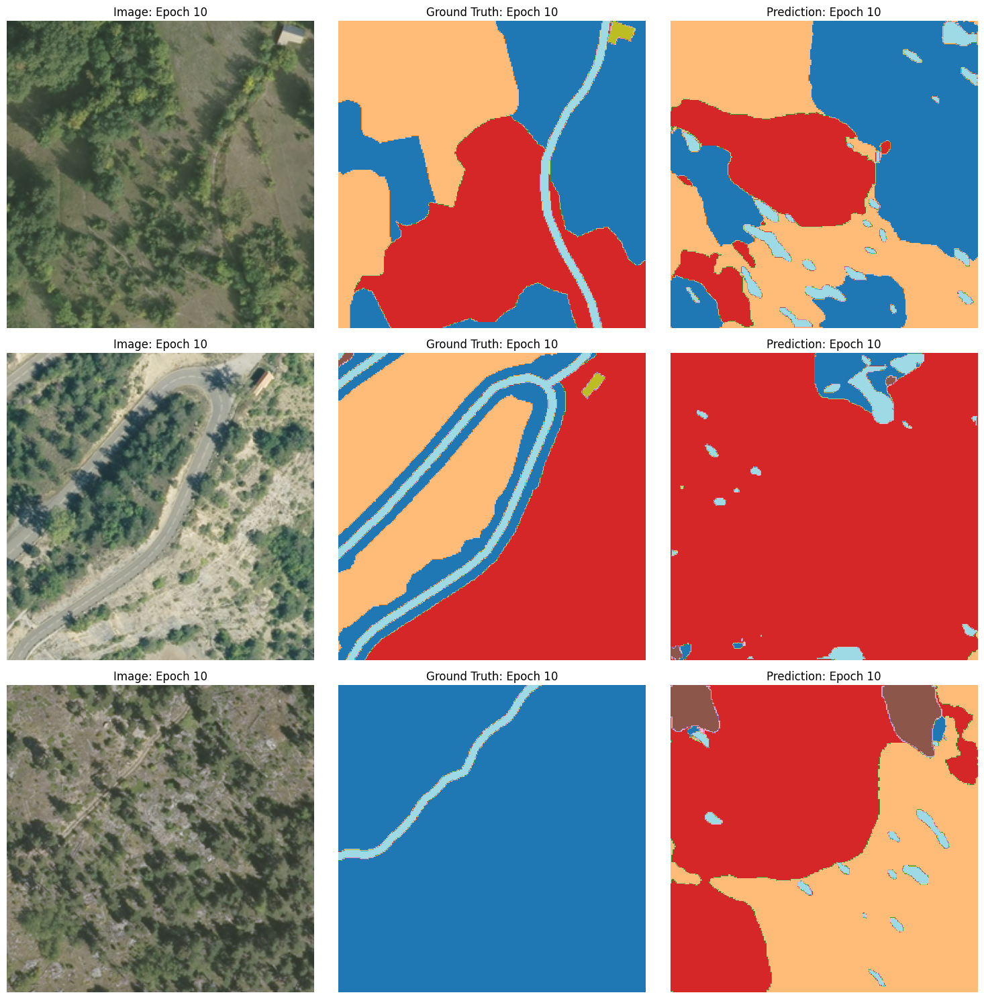

Epoch 10, Dice Coefficient: 0.4082
-------------------
169/169 ━━━━━━━━━━━━━━━━━━━━ 71s 402ms/step - dice_coef_multilabel_tf: 0.5243 - loss: 0.4757 - val_dice_coef_multilabel_tf: 0.4008 - val_loss: 0.6006 - learning_rate: 0.0010
Epoch 11/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step - dice_coef_multilabel_tf: 0.5330 - loss: 0.4670
Epoch 11: dice_coef_multilabel_tf improved from 0.51816 to 0.53299, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 76s 366ms/step - dice_coef_multilabel_tf: 0.5330 - loss: 0.4670 - val_dice_coef_multilabel_tf: 0.4519 - val_loss: 0.5415 - learning_rate: 0.0010
Epoch 12/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - dice_coef_multilabel_tf: 0.5439 - loss: 0.4561
Epoch 12: dice_coef_multilabel_tf improved from 0.53299 to 0.54002, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 64s 363ms/step - dice_coef_multilabel_tf: 0.5439 - loss: 0.4561 - val_dice_coef_multilabel_tf: 0.3924 - val_loss: 0.6016 - lea

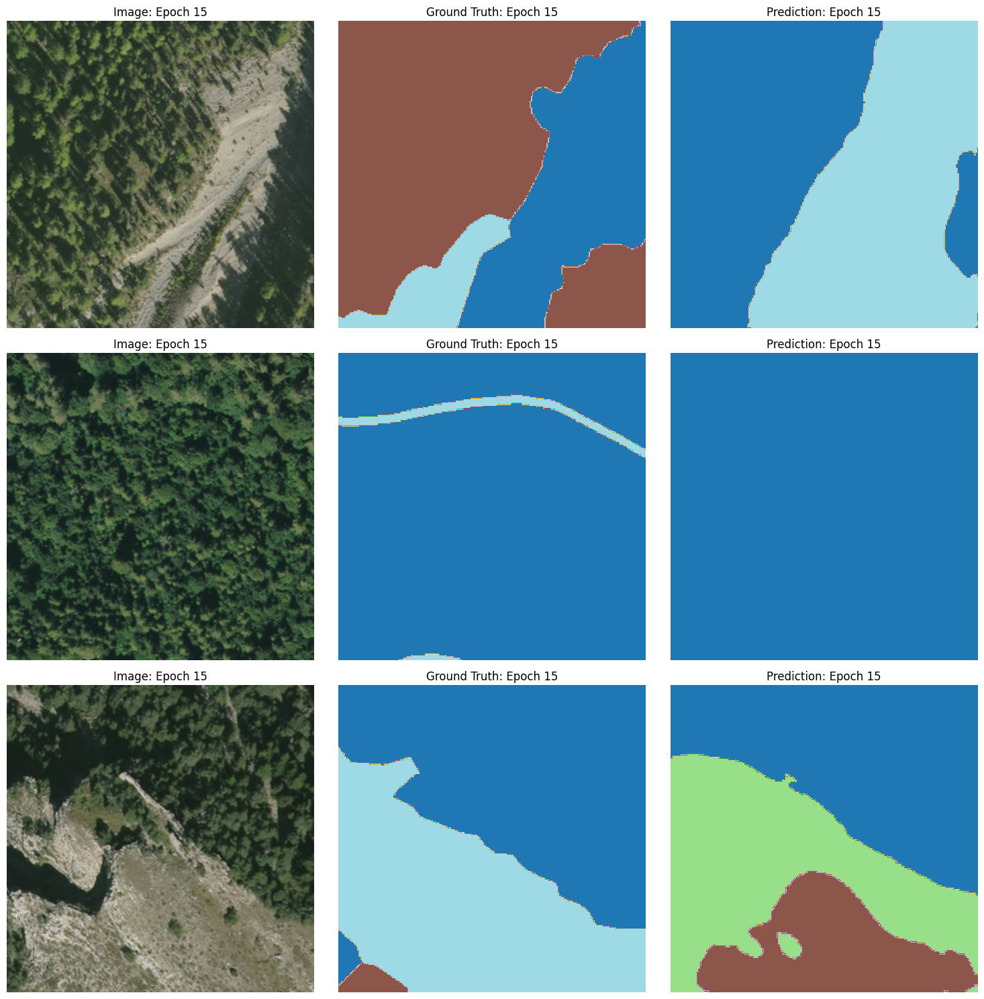

Epoch 15, Dice Coefficient: 0.3513
-------------------
169/169 ━━━━━━━━━━━━━━━━━━━━ 72s 406ms/step - dice_coef_multilabel_tf: 0.5535 - loss: 0.4465 - val_dice_coef_multilabel_tf: 0.4165 - val_loss: 0.5789 - learning_rate: 0.0010
Epoch 16/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - dice_coef_multilabel_tf: 0.5595 - loss: 0.4405
Epoch 16: dice_coef_multilabel_tf improved from 0.55283 to 0.55622, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 64s 362ms/step - dice_coef_multilabel_tf: 0.5595 - loss: 0.4405 - val_dice_coef_multilabel_tf: 0.4332 - val_loss: 0.5574 - learning_rate: 0.0010
Epoch 17/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - dice_coef_multilabel_tf: 0.5584 - loss: 0.4416
Epoch 17: dice_coef_multilabel_tf improved from 0.55622 to 0.55972, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 69s 392ms/step - dice_coef_multilabel_tf: 0.5584 - loss: 0.4416 - val_dice_coef_multilabel_tf: 0.4310 - val_loss: 0.5611 - lea

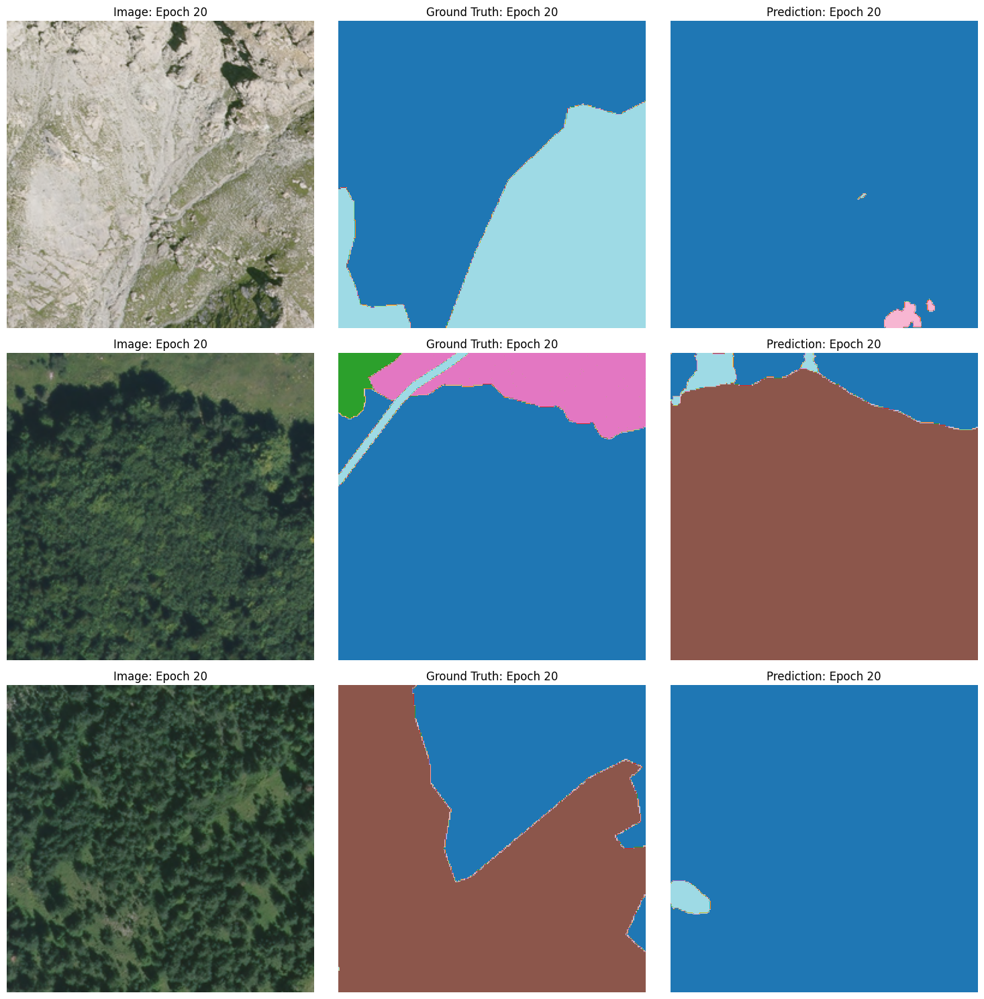

Epoch 20, Dice Coefficient: 0.4034
-------------------
169/169 ━━━━━━━━━━━━━━━━━━━━ 75s 428ms/step - dice_coef_multilabel_tf: 0.5716 - loss: 0.4284 - val_dice_coef_multilabel_tf: 0.3815 - val_loss: 0.6171 - learning_rate: 0.0010
Epoch 21/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step - dice_coef_multilabel_tf: 0.5676 - loss: 0.4324
Epoch 21: dice_coef_multilabel_tf did not improve from 0.57298

Epoch 21: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
169/169 ━━━━━━━━━━━━━━━━━━━━ 70s 358ms/step - dice_coef_multilabel_tf: 0.5677 - loss: 0.4323 - val_dice_coef_multilabel_tf: 0.3876 - val_loss: 0.6123 - learning_rate: 0.0010
Epoch 22/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step - dice_coef_multilabel_tf: 0.5945 - loss: 0.4055
Epoch 22: dice_coef_multilabel_tf improved from 0.57298 to 0.59731, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 64s 362ms/step - dice_coef_multilabel_tf: 0.5945 - loss: 0.4055 - val_dice_coef_multilabel_tf: 0.5522

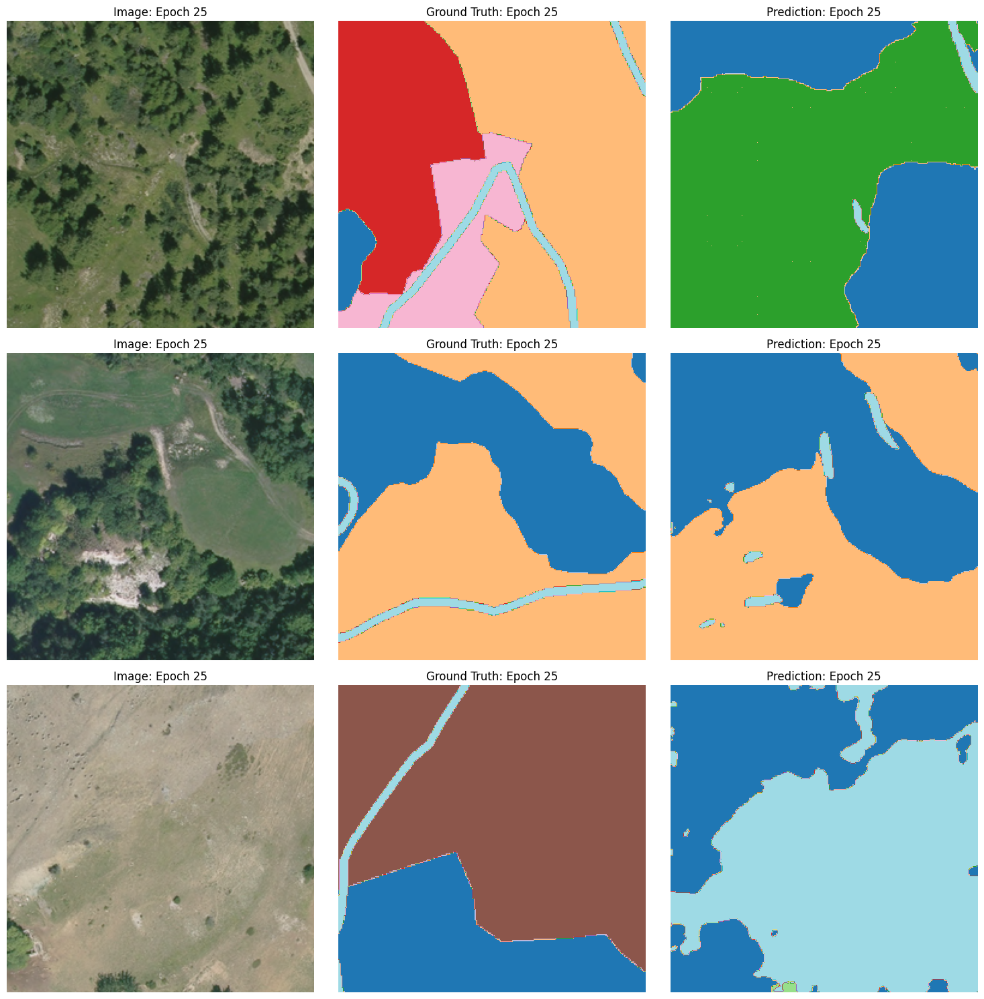

Epoch 25, Dice Coefficient: 0.5694
-------------------
169/169 ━━━━━━━━━━━━━━━━━━━━ 70s 397ms/step - dice_coef_multilabel_tf: 0.6099 - loss: 0.3901 - val_dice_coef_multilabel_tf: 0.5403 - val_loss: 0.4565 - learning_rate: 2.0000e-04
Epoch 26/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - dice_coef_multilabel_tf: 0.6193 - loss: 0.3807
Epoch 26: dice_coef_multilabel_tf improved from 0.60985 to 0.61795, saving model to /kaggle/working/best_model.keras
169/169 ━━━━━━━━━━━━━━━━━━━━ 64s 361ms/step - dice_coef_multilabel_tf: 0.6193 - loss: 0.3807 - val_dice_coef_multilabel_tf: 0.5590 - val_loss: 0.4303 - learning_rate: 2.0000e-04
Epoch 27/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step - dice_coef_multilabel_tf: 0.6098 - loss: 0.3902
Epoch 27: dice_coef_multilabel_tf did not improve from 0.61795
169/169 ━━━━━━━━━━━━━━━━━━━━ 63s 356ms/step - dice_coef_multilabel_tf: 0.6098 - loss: 0.3902 - val_dice_coef_multilabel_tf: 0.5662 - val_loss: 0.4334 - learning_rate: 2.0000e-04
Epoch 28/30
169/169 ━━━

In [13]:
# Compile the model
model.compile(optimizer=optimizer,
              loss=dice_loss,
              metrics=[dice_coef_multilabel_tf])

# Train the model 
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=30,
    callbacks=callbacks,
    # class_weight=class_weights # silence it, if we are using dice loss
)

# step 5: evaluate the model on test set 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

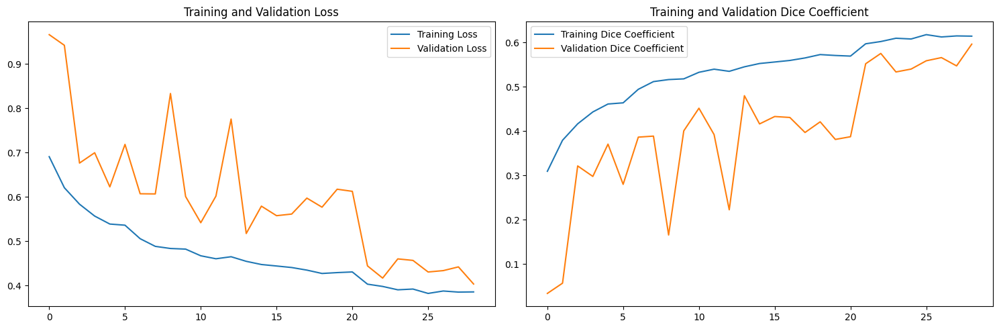

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


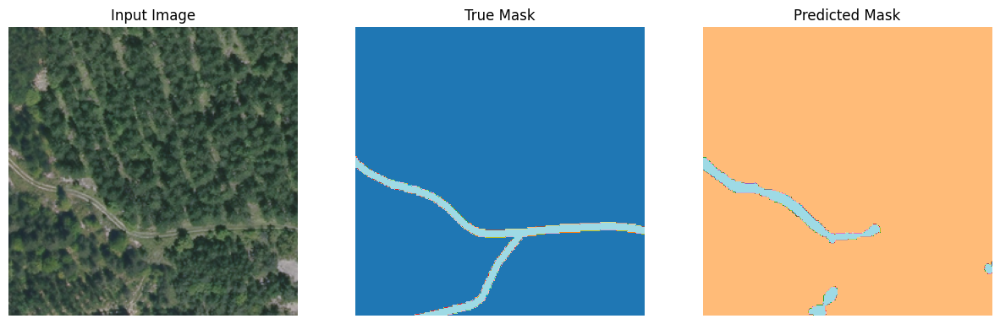

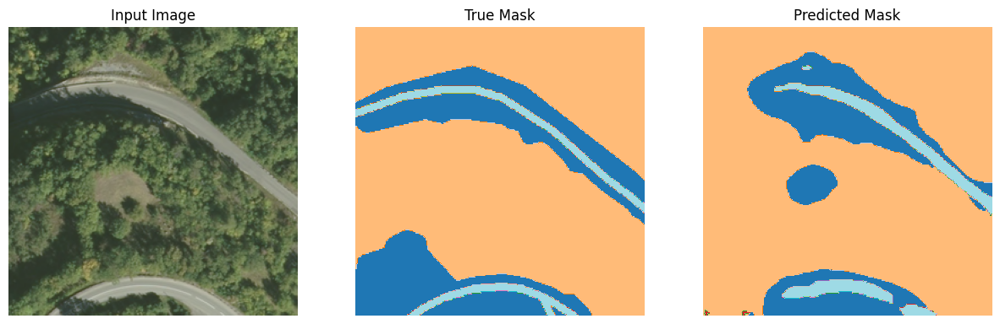

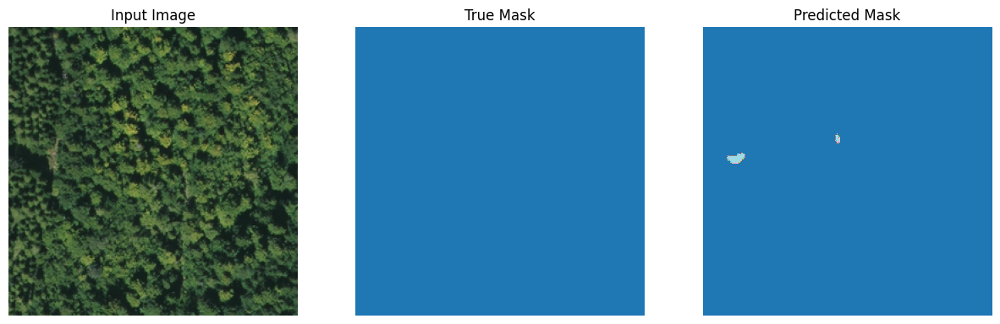

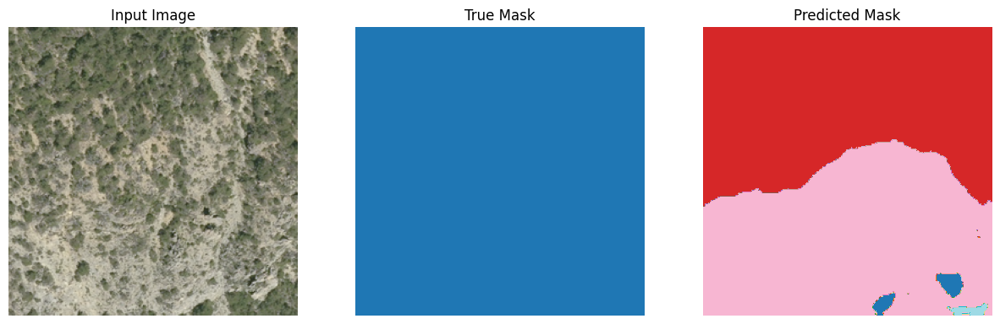

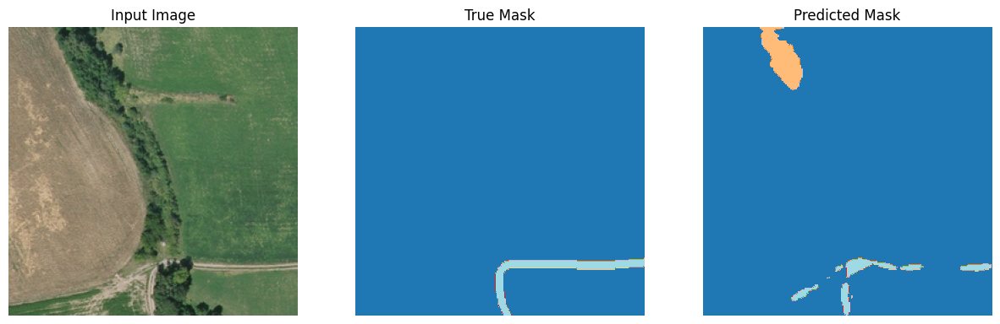

In [14]:
# Function to evaluate model on test set
def evaluate_on_test_set(model, test_dataset, num_classes):
    dice_scores = []
    for images, masks in test_dataset:
        predictions = model.predict(images)
        dice_score = dice_coef_multilabel(masks.numpy(), predictions, num_classes)
        # save dice score for each batch 
        dice_scores.append(dice_score)
    
    # compute average on the entire test dataset
    average_dice = np.mean(dice_scores)
    print(f"Average Dice Coefficient on test set: {average_dice:.4f}")
    return average_dice

# Evaluate on test set
average_dice = evaluate_on_test_set(model, test_dataset, num_classes)

# Plot training history
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['dice_coef_multilabel_tf'], label='Training Dice Coefficient')
plt.plot(history.history['val_dice_coef_multilabel_tf'], label='Validation Dice Coefficient')
plt.title('Training and Validation Dice Coefficient')
plt.legend()

plt.tight_layout()
plt.show()

# Visualize some predictions
def visualize_predictions(dataset, model, num_images=5):
    for images, masks in dataset.take(1):
        predictions = model.predict(images)
        
        for i in range(min(num_images, images.shape[0])):
            plt.figure(figsize=(15, 5))
            
            plt.subplot(1, 3, 1)
            plt.imshow(images[i])
            plt.title('Input Image')
            plt.axis('off')
            
            plt.subplot(1, 3, 2)
            plt.imshow(tf.argmax(masks[i], axis=-1), cmap='tab20')
            plt.title('True Mask')
            plt.axis('off')
            
            plt.subplot(1, 3, 3)
            plt.imshow(tf.argmax(predictions[i], axis=-1), cmap='tab20')
            plt.title('Predicted Mask')
            plt.axis('off')
            
            plt.show()

visualize_predictions(test_dataset, model)